<div style="background-color: violet; padding: 10px; text-align: center;">
   
<h1 style="font-weight: bold; font-style: italic;">Diabetes</h1>
   
</div>

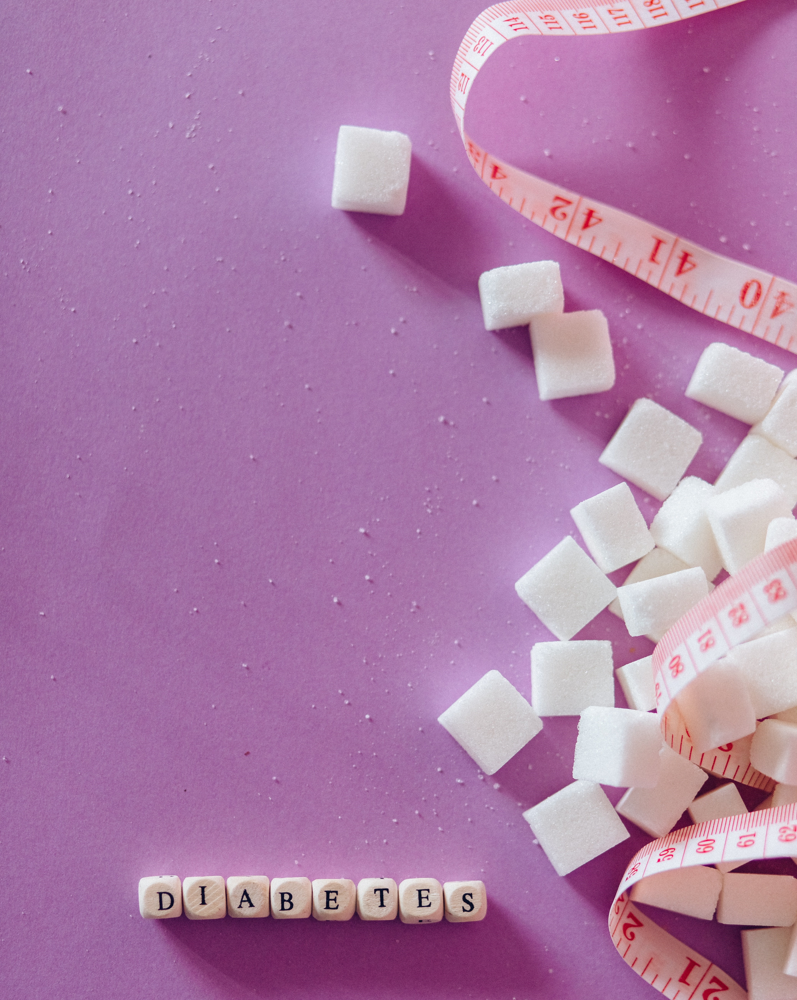

## * This dataset has 17 feature variables and 1 target variable,We take 'Diabetes' as the Target Variable.
## * In This Classification Method We are going to predict weather the features are reason for dibetic  or not

### 1. Age:: 13-level age category arranged in 5 years steps: 1 = 18-24; 2 = 25-29; ...; 9 = 60-64; ...; 13 = 80 or older.
### 2.Sex:: patient's gender 1 = male; 0 = female.
### 3.HighChol:: 0 = no high cholesterol; 1 = high cholesterol.
### 4.CholCheck:: 0 = no cholesterol check in 5 years; 1 = yes cholesterol check in 5 years.
### 5.BMI:: Body Mass Index.
### 6.Smoker:: Have you smoked at least 100 cigarettes in your entire life? (Note: 5 packs = 100 cigarettes) 0 = no;  1                         = yes.
### 7.HeartDiseaseorAttack:: coronary heart disease (CHD) or myocardial infarction (MI) 0 = no; 1 = yes.
### 8.PhysActivity: physical activity in past 30 days - not including job 0 = no; 1 = yes.
### 9.Fruits: Consume Fruit 1 or more times per day 0 = no; 1 = yes.
### 10.Veggies: Consume Vegetables 1 or more times per day 0 = no; 1 = yes.
### 11.HvyAlcoholConsump: (adult men >=14 drinks per week and adult women>=7 drinks per week) 0 = no; 1 = yes.
### 12.GenHlth: Would you say that in general your health is: scale 1-5 1 = excellent; 2 = very good; 3 = good; 4 = fair; 5 = poor.
### 13.MentHlth: days of poor mental health scale 1-30 days.
### 14.PhysHlth: physical illness or injury days in past 30 days scale 1-30.
### 15.DiffWalk: Do you have serious difficulty walking or climbing stairs? 0 = no; 1 = yes.
### 16.Stroke: you ever had a stroke 0 = no; 1 = yes.
### 17.HighBP: 0 = no high; BP 1 = high BP.
### 18.Diabetes: 0 = no diabetes; 1 = diabetes.

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Importing the Dependencies
    </h2>
</div>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn import metrics
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score, roc_curve
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression,RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Read Data from csv 
    </h2>
</div>

In [2]:
db=pd.read_csv('diabetes_data.csv')
db

,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,Diabetes
0,4.0,1.0,0.0,1.0,26.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,5.0,30.0,0.0,0.0,1.0,0.0
1,12.0,1.0,1.0,1.0,26.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,1.0,1.0,0.0
2,13.0,1.0,0.0,1.0,26.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,10.0,0.0,0.0,0.0,0.0
3,11.0,1.0,1.0,1.0,28.0,1.0,0.0,1.0,1.0,1.0,0.0,3.0,0.0,3.0,0.0,0.0,1.0,0.0
4,8.0,0.0,0.0,1.0,29.0,1.0,0.0,1.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,6.0,0.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,1.0
70688,10.0,1.0,1.0,1.0,29.0,1.0,1.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0
70689,13.0,0.0,1.0,1.0,25.0,0.0,1.0,0.0,1.0,0.0,0.0,5.0,15.0,0.0,1.0,0.0,1.0,1.0
70690,11.0,0.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,1.0


In [3]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   70692 non-null  float64
 1   Sex                   70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   HeartDiseaseorAttack  70692 non-null  float64
 7   PhysActivity          70692 non-null  float64
 8   Fruits                70692 non-null  float64
 9   Veggies               70692 non-null  float64
 10  HvyAlcoholConsump     70692 non-null  float64
 11  GenHlth               70692 non-null  float64
 12  MentHlth              70692 non-null  float64
 13  PhysHlth              70692 non-null  float64
 14  DiffWalk              70692 non-null  float64
 15  Stroke             

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Checking for Null values
    </h2>
</div>

In [4]:
db.isnull().mean()*100

Age                     0.0
Sex                     0.0
HighChol                0.0
CholCheck               0.0
BMI                     0.0
Smoker                  0.0
HeartDiseaseorAttack    0.0
PhysActivity            0.0
Fruits                  0.0
Veggies                 0.0
HvyAlcoholConsump       0.0
GenHlth                 0.0
MentHlth                0.0
PhysHlth                0.0
DiffWalk                0.0
Stroke                  0.0
HighBP                  0.0
Diabetes                0.0
dtype: float64

In [5]:
db.describe()

,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,Diabetes
count,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000
mean,8.584055,0.456997,0.525703,0.975259,29.856985,0.475273,0.147810,0.703036,0.611795,0.788774,0.042721,2.837082,3.752037,5.810417,0.252730,0.062171,0.563458,0.500000
std,2.852153,0.498151,0.499342,0.155336,7.113954,0.499392,0.354914,0.456924,0.487345,0.408181,0.202228,1.113565,8.155627,10.062261,0.434581,0.241468,0.495960,0.500004
min,1.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,0.000000,0.000000,1.000000,25.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,9.000000,0.000000,1.000000,1.000000,29.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.500000
75%,11.000000,1.000000,1.000000,1.000000,33.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,4.000000,2.000000,6.000000,1.000000,0.000000,1.000000,1.000000
max,13.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,1.000000,1.000000


<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Univariate analysis 
    </h2>
</div>

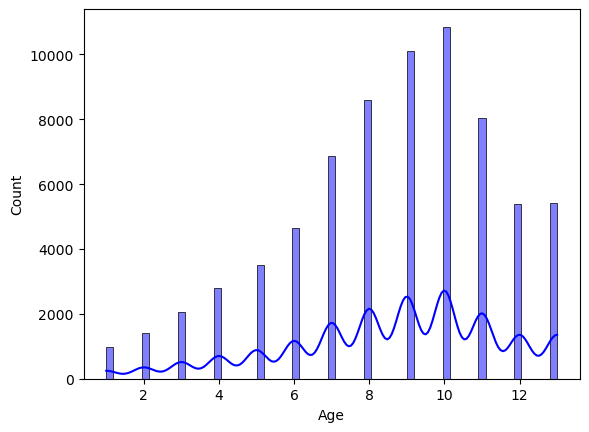

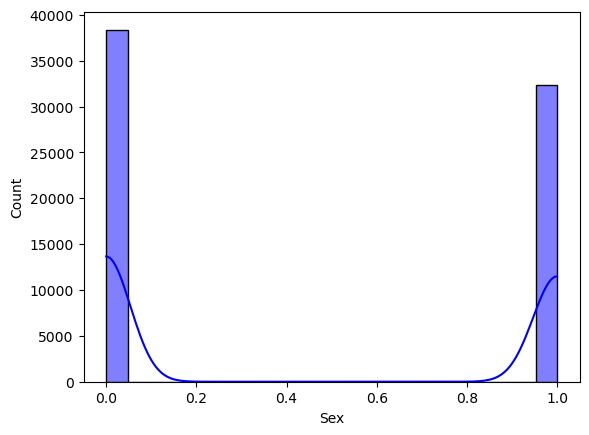

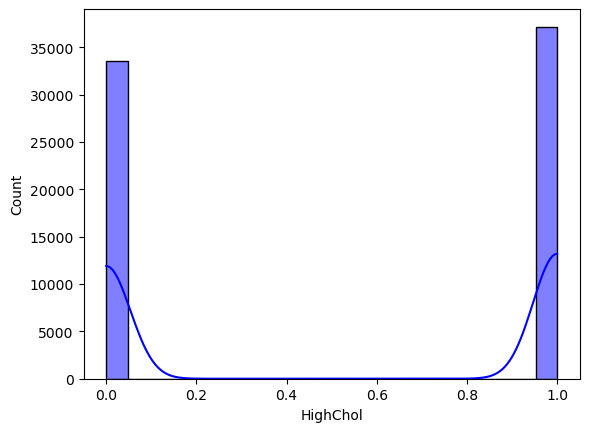

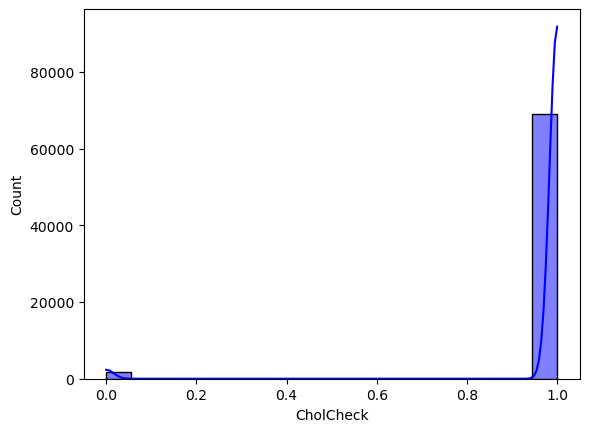

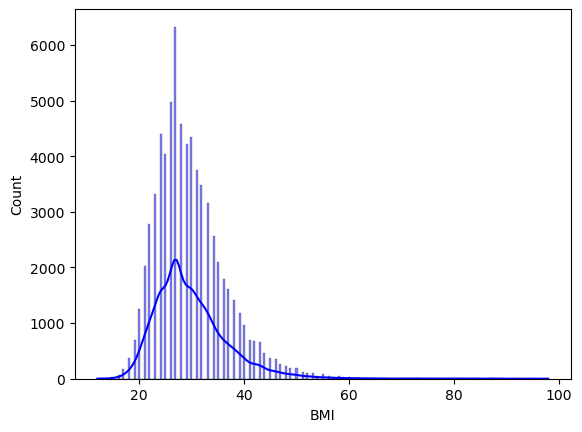

...

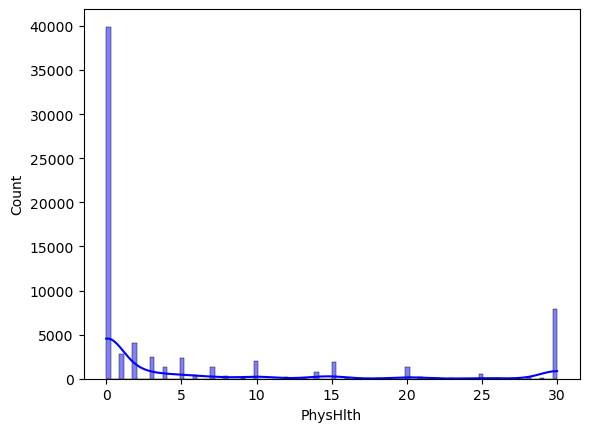

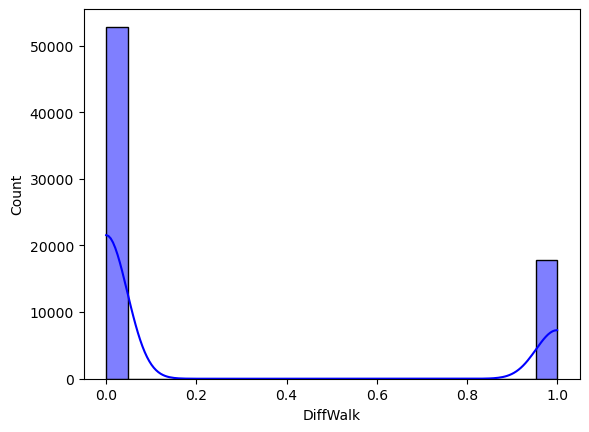

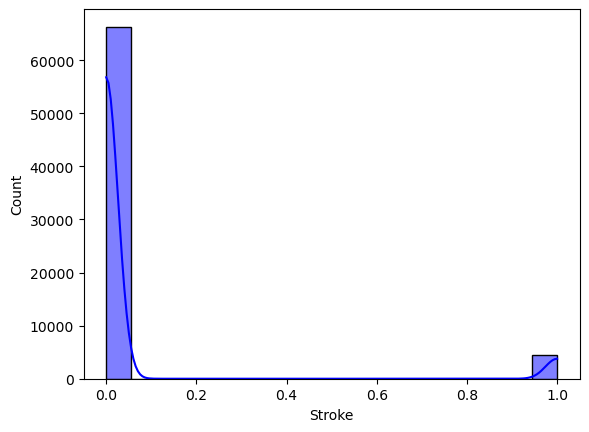

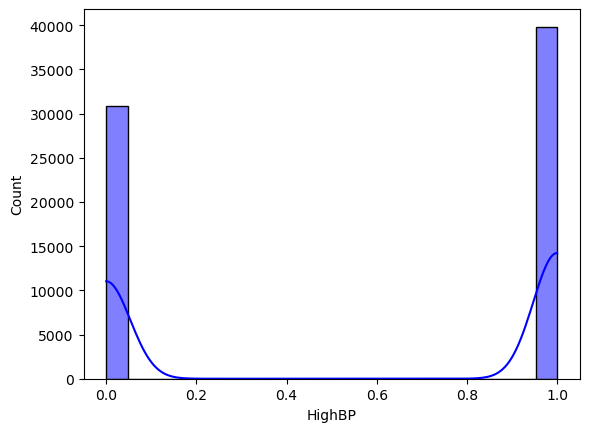

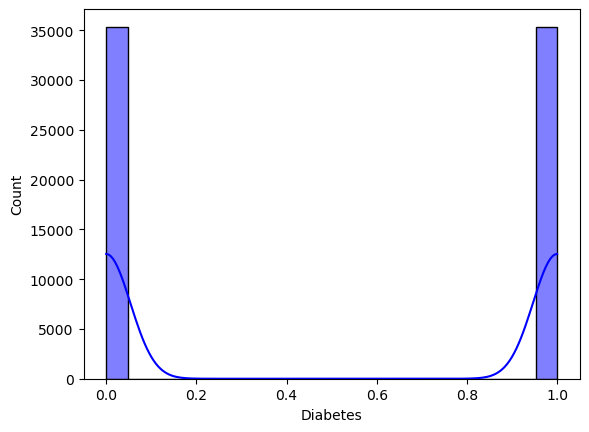

In [6]:
for i in db.columns:
    if db[i].dtype != "object":
        sns.histplot(x=db[i], kde=True, color="blue")
        plt.show()

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Checking for Outliers
    </h2>
</div>

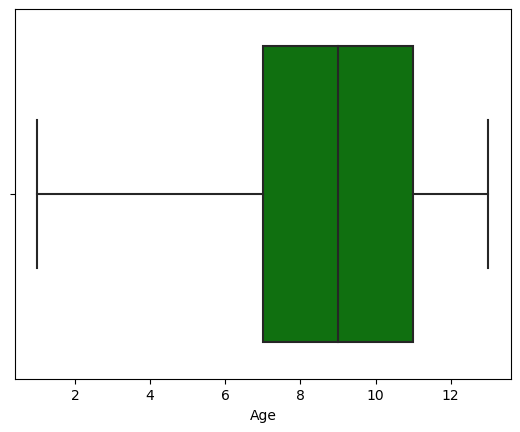

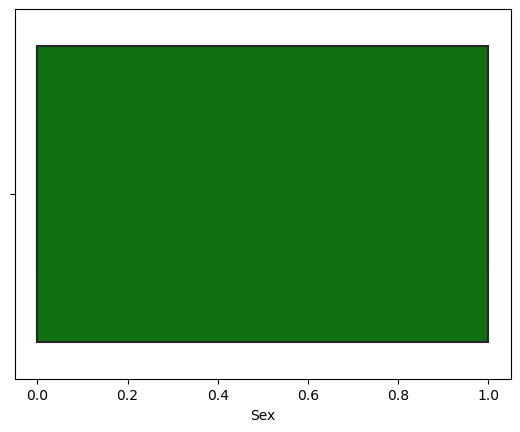

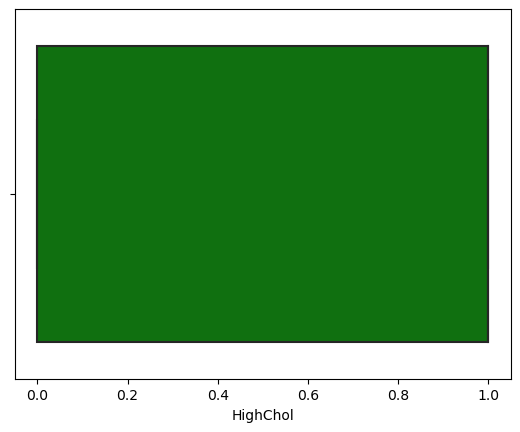

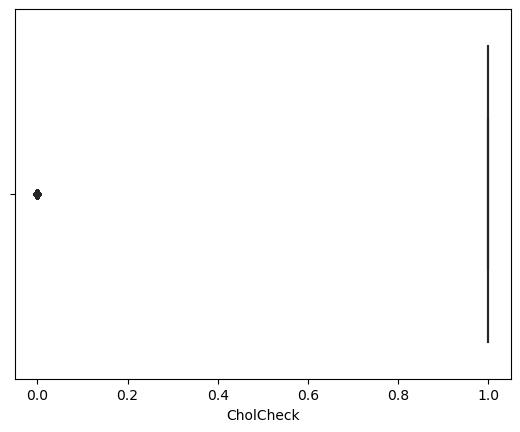

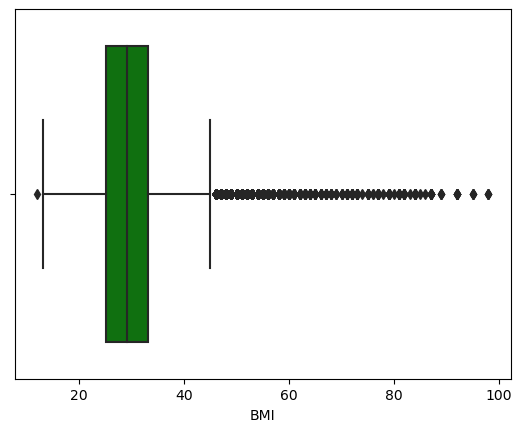

...

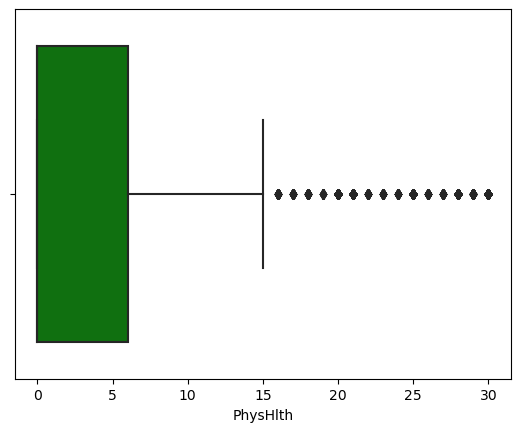

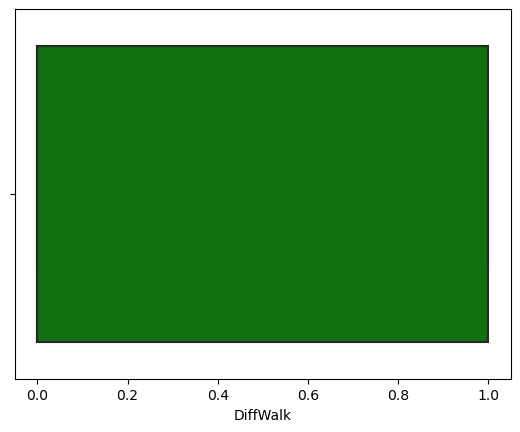

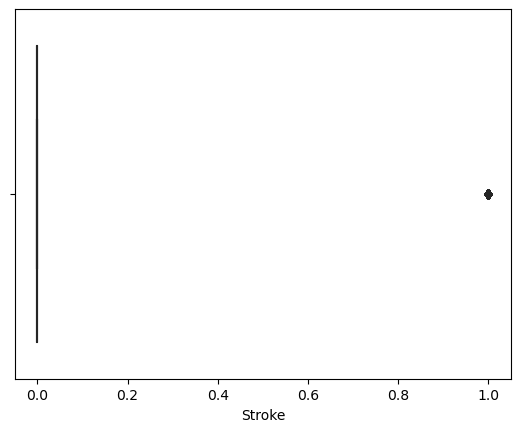

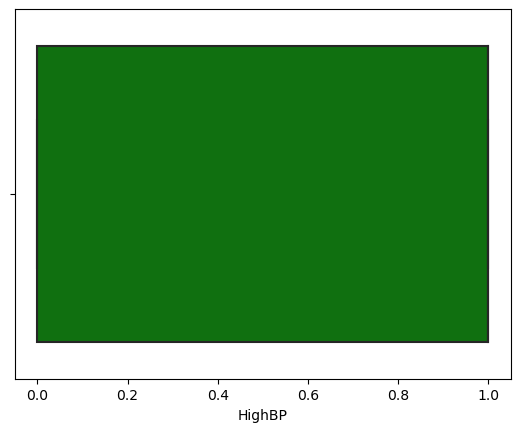

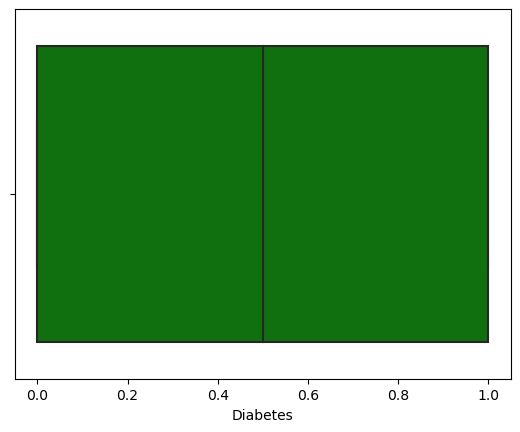

In [7]:
for i in db.columns:
    if db[i].dtype != "object":
        sns.boxplot(x=db[i],color="green")
        plt.show()

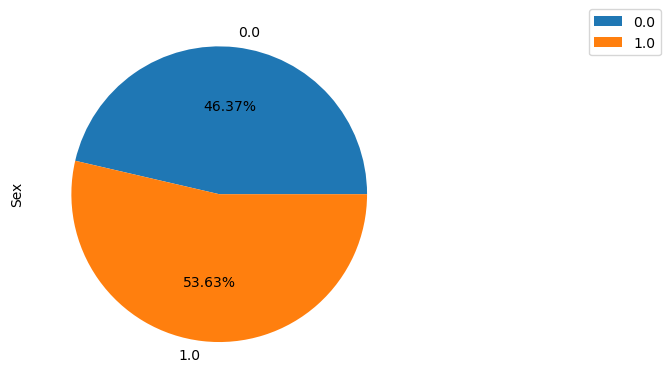

In [8]:
x=db.groupby(['Smoker'])['Sex'].sum()
x.plot.pie(autopct='%1.2f%%')
plt.legend(bbox_to_anchor=(1.5,  1),loc='upper left',borderaxespad=0)
plt.show()

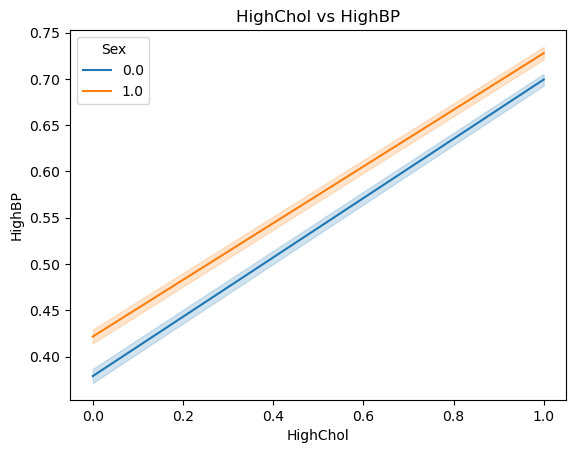

In [9]:
sns.lineplot('HighChol','HighBP',data=db, hue="Sex")
plt.title("HighChol vs HighBP")
plt.show()

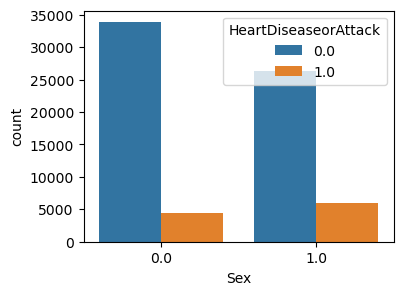

In [10]:
plt.figure(figsize=(4,3))
sns.countplot('Sex',hue='HeartDiseaseorAttack',data=db)
plt.show()

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Setting the Outerlimit
    </h2>
</div>

In [11]:
def outlier_limit(col):
    Q3, Q1 = np.nanpercentile (col, [75,25])
    IQR = Q3 - Q1
    UL = Q3+1.5*IQR
    LL = Q1-1.5*Q1
    return UL, LL

In [12]:
for i in db.columns:
    if db[i].dtype != "object":
        UL, LL = outlier_limit(db[i])
        db[i] = np.where((db[i]>UL) | (db[i]<LL),np.nan,db[i])

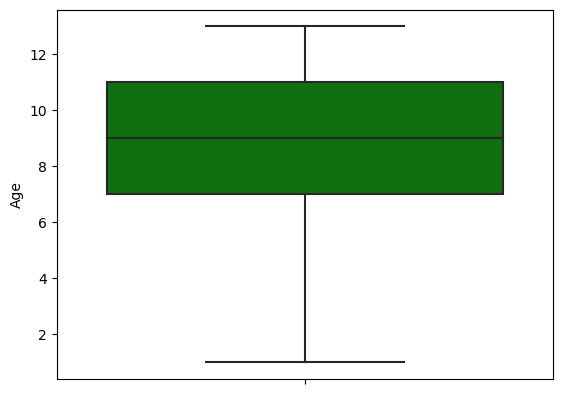

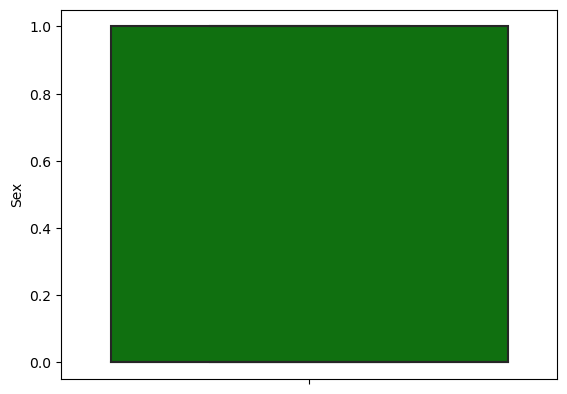

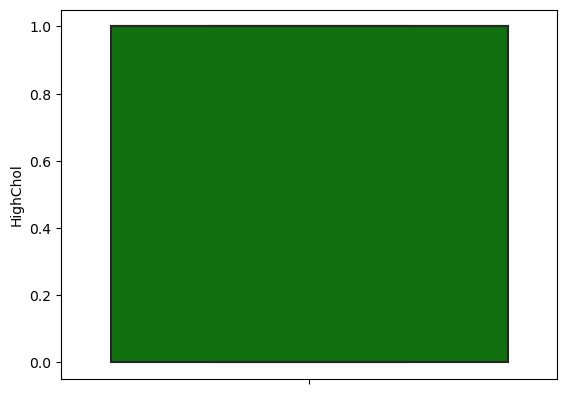

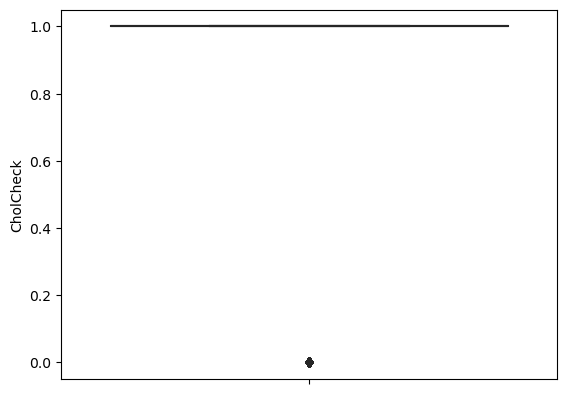

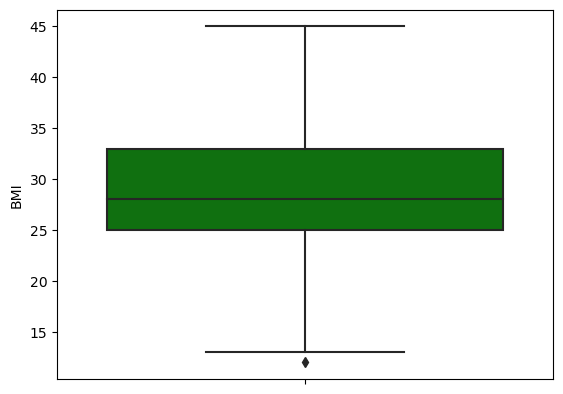

...

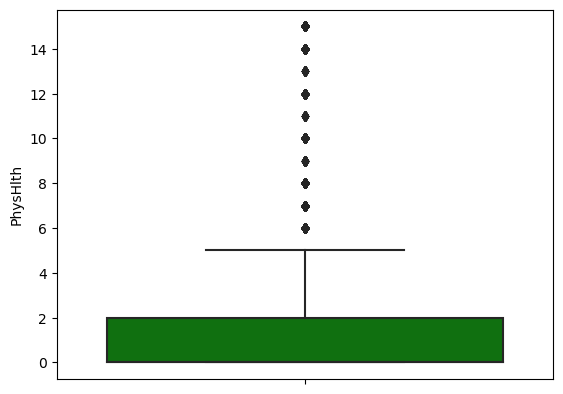

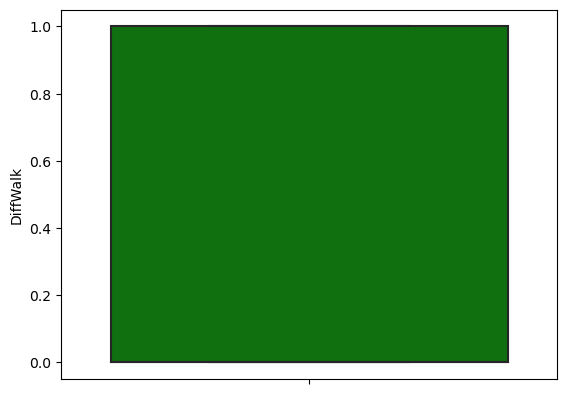

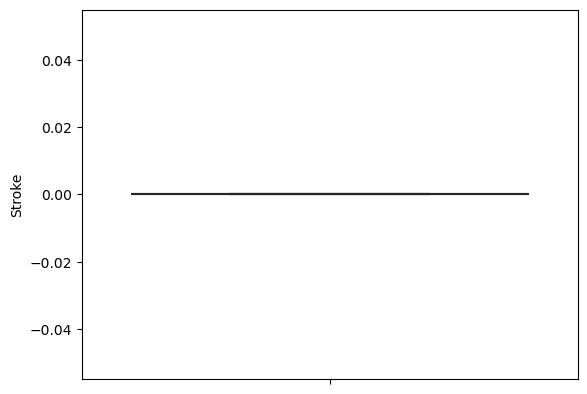

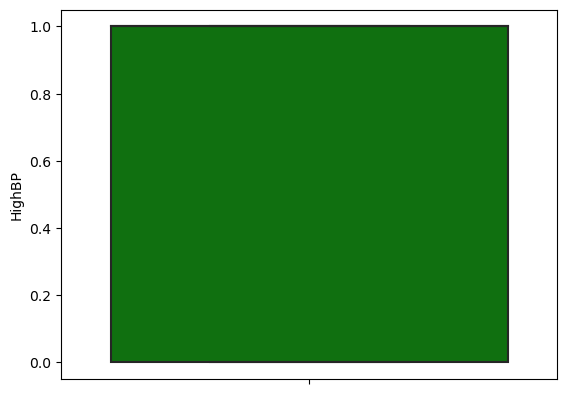

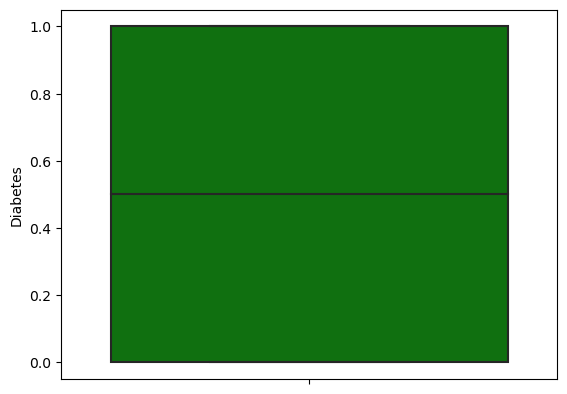

In [13]:
for i in db.columns:
    if db[i].dtype != "object":
        sns.boxplot(y = db[i], color="green")
        plt.show()

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Checking for Nullvalues after clearing the outliers
    </h2>
</div>

In [14]:
db.isnull().mean()*100

Age                      0.000000
Sex                      0.000000
HighChol                 0.000000
CholCheck                0.000000
BMI                      3.083800
Smoker                   0.000000
HeartDiseaseorAttack    14.781022
PhysActivity             0.000000
Fruits                   0.000000
Veggies                  0.000000
HvyAlcoholConsump        4.272053
GenHlth                  0.000000
MentHlth                16.714763
PhysHlth                15.028575
DiffWalk                 0.000000
Stroke                   6.217111
HighBP                   0.000000
Diabetes                 0.000000
dtype: float64

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
        Droping the rows having Nullvalues
    </h2>
</div>

In [15]:
db.dropna(inplace=True)

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
       Checking the correlation with the target 'Diabetes'
    </h2>
</div>

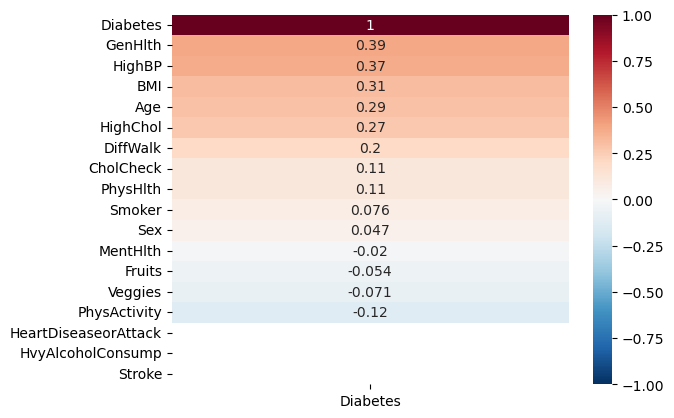

In [16]:

sns.heatmap(db.corr()[["Diabetes"]].sort_values(by="Diabetes",ascending=False),vmin=-1,vmax=1,annot=True,cmap="RdBu_r");

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
      Lets take only the columns with good correlation with the target'
    </h2>
</div>

###  Here GenHlth,HighBP,BMI are the columns which are highly corelated with the target.so we have to take these column as our features

In [17]:
x=db[['GenHlth','HighBP','BMI']].values
y=db[['Diabetes']].values

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
     We have to standardize the values  
    </h2>
</div>

In [18]:
sc=StandardScaler()
x= sc.fit_transform(x)

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
     Classification Models  
    </h2>
</div>

In [20]:
models = {
    "LogisticRegression": LogisticRegression(),
  "Ridge":RidgeClassifier(),
    "DecisionTreeClassifier":DecisionTreeClassifier(),
    "GradientBoostingClassifier":GradientBoostingClassifier(),
    "AdaBoostClassifier":AdaBoostClassifier(),
    "RandomForestClassifier":RandomForestClassifier(),
    "KNeighborsClassifier":KNeighborsClassifier()  
}

In [21]:
for name, model in models.items():
    scores = cross_val_score(model, x,y, scoring="neg_mean_squared_error",cv=10,n_jobs=-1)
    print("cross validation model : {}".format(name))
    rmse = np.sqrt(-scores)
    rmse_average = np.mean(rmse)
    print("AVERAGE RMSE: ",rmse_average)
    print("*"*100)

cross validation model : LogisticRegression
AVERAGE RMSE:  0.5249966533962497
****************************************************************************************************
cross validation model : Ridge
AVERAGE RMSE:  0.5251515252868695
****************************************************************************************************
cross validation model : DecisionTreeClassifier
AVERAGE RMSE:  0.5275417617273043
****************************************************************************************************
cross validation model : GradientBoostingClassifier
AVERAGE RMSE:  0.5265534094173361
****************************************************************************************************
cross validation model : AdaBoostClassifier
AVERAGE RMSE:  0.526675936561353
****************************************************************************************************
cross validation model : RandomForestClassifier
AVERAGE RMSE:  0.5276105728349678
*************************

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
    Splitting the data into training and testing set
    </h2>
</div>

In [22]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size= 0.2, random_state=0)

<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
    Model Building
    </h2>
</div>

#### By Cross Validation,we take LogisticRegression because LogisticRegression have low Average RMSE

In [23]:
model = LogisticRegression()

In [24]:
model.fit(x_train, y_train)
print("model trained with {}".format(model))
score_train =accuracy_score (y_train, model.predict(x_train))
score_tst = accuracy_score(y_test, model.predict(x_test))
con_train = confusion_matrix(y_train, model.predict(x_train))
con_test = confusion_matrix(y_test, model.predict(x_test))
print("Model accuracy on train is:: ",score_train)
print("Model accuracy on test is:: ", score_tst)
print("confusion_matrix train is:: ", con_train)
print("confusion_matrix test is:: ", con_test)
print("Wrong Predictions made:",(y_test !=model.predict(x_test)).sum(),'/',((y_test == model.predict(x_test)).sum()+(y_test != model.predict(x_test)).sum()))

model trained with LogisticRegression()
Model accuracy on train is::  0.7250851978070826
Model accuracy on test is::  0.7222946544980443
confusion_matrix train is::  [[15650  4016]
 [ 5261  8818]]
confusion_matrix test is::  [[3878 1052]
 [1291 2216]]
Wrong Predictions made: 34238923 / 71182969


In [25]:
OUTPUT= pd.DataFrame(zip(y,model.predict(x)), columns=("ACTUAL", "PREDICTION"), dtype = int)
OUTPUT.head()

,ACTUAL,PREDICTION
0,0,0
1,0,1
2,0,0
3,0,1
4,0,0


<div style="background-color:#c487cf;text-align: center;box-shadow: rgba(0, 0, 0, 0.24) 0px 3px 8px;">
    <h2 style='padding-top:10px;padding-bottom: 10px;'>
    ROC CURVE
    </h2>
</div>

Model used is::  LogisticRegression()


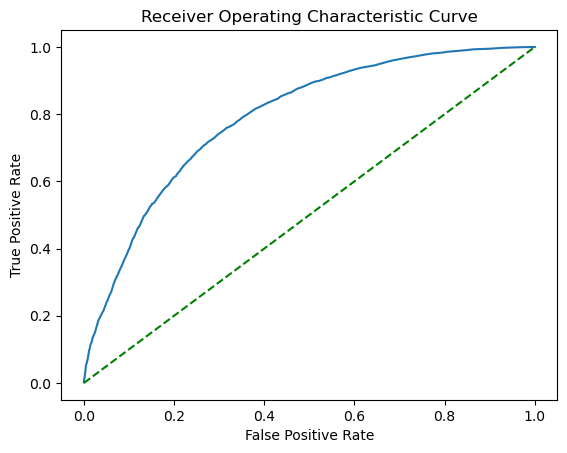

In [26]:
model.fit(x_train,y_train)
probs=model.predict_proba(x_test)
preds=probs[:,1]
fpr,tpr,threshold=metrics.roc_curve(y_test,preds)
roc_auc=metrics.auc(fpr,tpr)
print("Model used is:: ", model)
sns.lineplot(x=fpr, y=tpr)
plt.plot([0,1],[0,1],color='green',linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curve')
plt.show()